<h1 style = "color : Sky blue"> Plotting Exercise(Numpy Attributes)</h1>

As you learnt in the session, data visualisation is an essential skill for a data scientist to have. Charts and graphs are the easiest way to communicate data to different kinds of consumers. The assessments in this notebook will test your ability to represent information. The questions will be investigative and will not have detailed instructions about the execution; you will have to figure that part out yourself. Don't worry, there are no wrong answers here, only happy accidents. Try these questions on your own, to verify if you have done the task correctly, look at the solution as a person who does not know the data and is looking at it for the first time. You will be able to identify better ways to represent data automatically.  

The dataset given for this notebook is the pricing data for diamonds based on the carat, cut, colour and so on. Take a look at the data below and also the data dictionary for a better understanding of the data and the attributes. 

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [5]:
df =pd.read_csv(r'/Users/aniketyadav/Documents/DS/DataSets/diamonds.csv', header = 0)
df = df.drop("Unnamed: 0", axis =1 )
df['res'] = np.where((df['price'] > 4500) | (df['carat'] > 2.9), 1, 0)

In [6]:
data = pd.read_csv(r'/Users/aniketyadav/Documents/DS/DataSets/diamonds.csv', header = 0)

data = data.drop("Unnamed: 0", axis =1 )
data['res'] = np.where((data['price'] > 4500) | (data['carat'] > 2.9), 1, 0)

data

,carat,cut,color,clarity,depth,table,price,x,y,z,res
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43,0
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31,0
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31,0
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63,0
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75,0
...,...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50,0
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61,0
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56,0
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74,0


In [7]:
data.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
res        0
dtype: int64

### Data Dictionary: 

1. **carat**: Weight of the diamond (0.2--5.01)

2.  **cut**: Quality of the cut (Fair, Good, Very Good, Premium, Ideal)

3. **color**: Diamond colour, from J (worst) to D (best)

4. **clarity**: A measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))

5. **depth**: Total depth percentage = z / mean(x, y) = 2 * z / (x + y) (43--79)

6. **table**: Width of top of diamond relative to widest point (43--95)

7. **price**: Price in US dollars (326 dollars -18,823 dollars)

8. **x**: Length in mm (0--10.74)

9. **y**: Width in mm (0--58.9)

10. **z**: Depth in mm (0--31.8)

11. **res**: If this Diamond is recommended to buy or not ( 1 = 'YES', 0 = 'NO' )

<h3 style = "color : Brown"> Question </h3>

Investigate the variation of prices of diamonds and note your observations. 

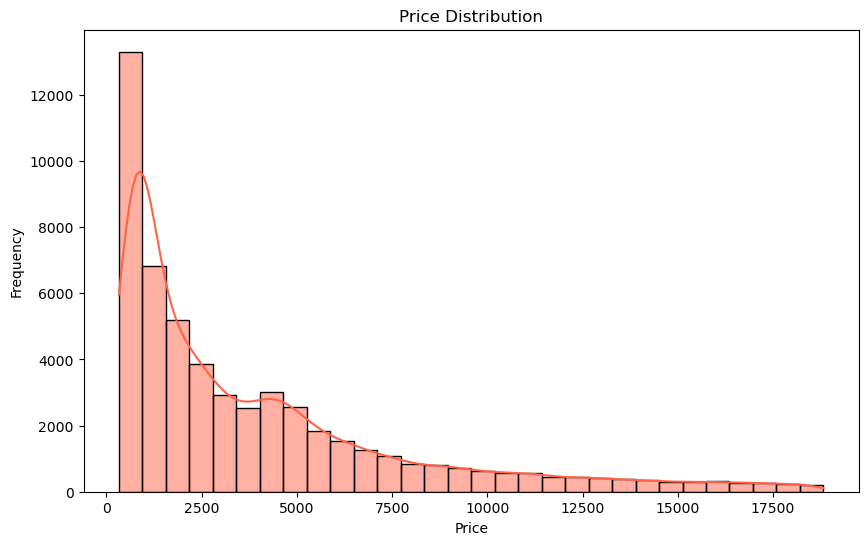

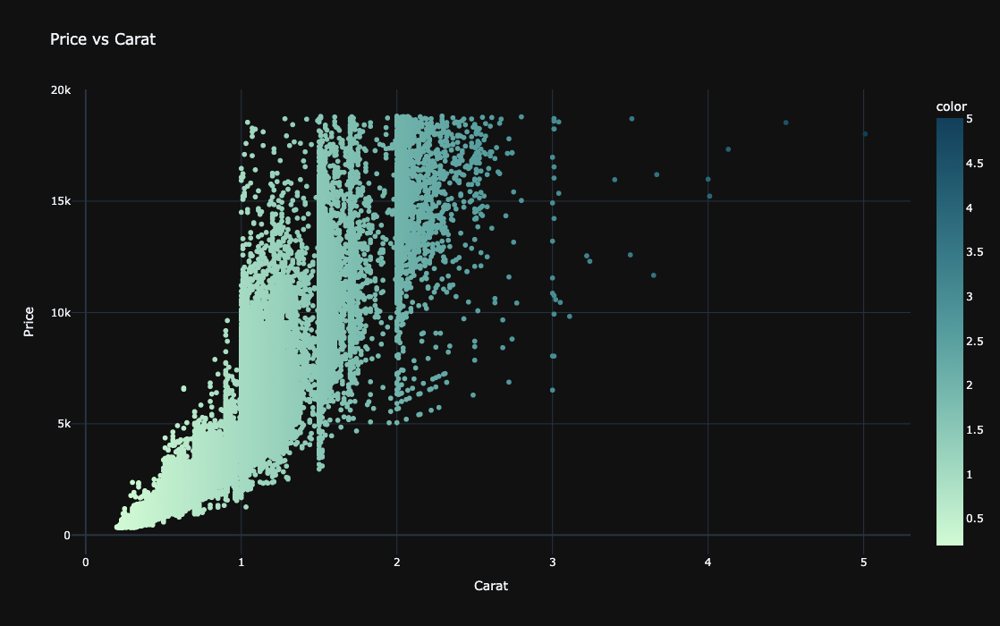

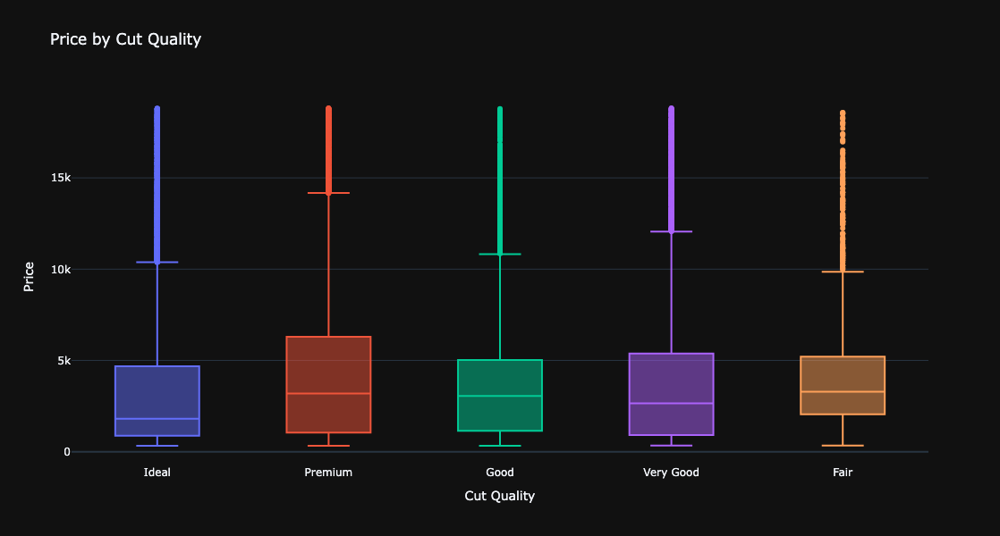

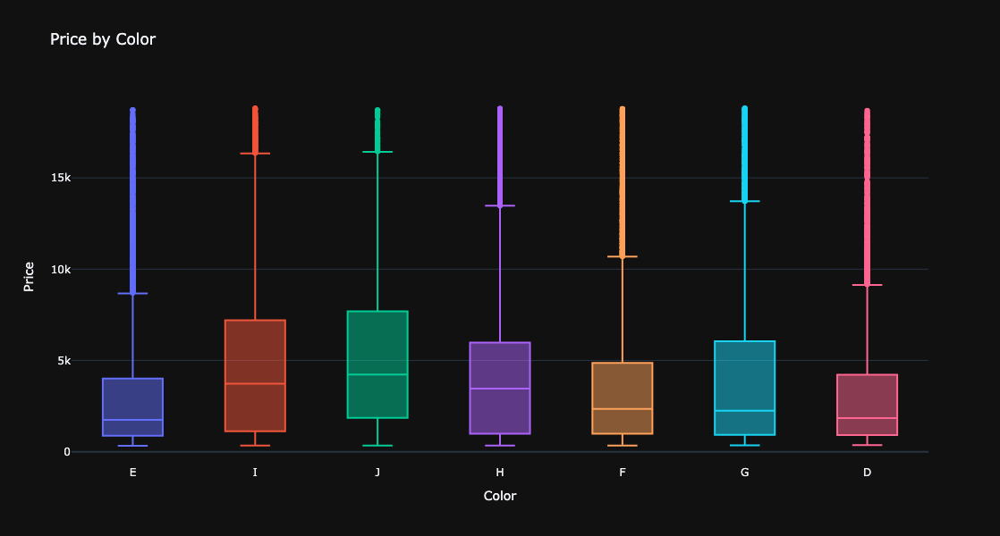

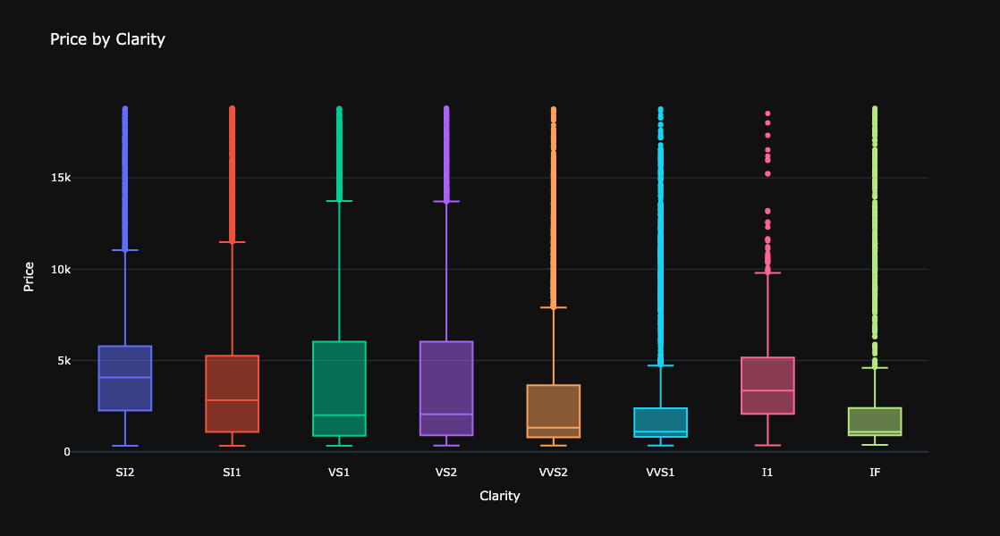

In [40]:
plt.figure(figsize=(10, 6))
sns.histplot(df['price'], kde=True, bins=30, color='tomato')
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

# 2. Price vs Carat
fig = px.scatter(x=df['carat'], y = df['price'], title='Price vs Carat', color=df['carat'], color_continuous_scale=px.colors.sequential.Darkmint)
fig.update_xaxes(title_text = 'Carat')
fig.update_yaxes(title_text= 'Price')
fig.update_layout(template='plotly_dark')
fig.update_layout(height=700)
fig.show()

# 3. Price by Cut Quality
fig = px.box( df,x='cut',y='price',title='Price by Cut Quality',labels={'cut': 'Cut Quality', 'price': 'Price'},color='cut') 
fig.update_layout(showlegend=False)
fig.update_layout(template='plotly_dark')
fig.update_layout(height=600)
fig.show()


# 4. Price by Color
fig = px.box(
    df,
    x='color',
    y='price',
    title='Price by Color',
    labels={'color': 'Color', 'price': 'Price'},
    color='color'  # Optional: Add color by color categories
)
fig.update_layout(showlegend=False)
fig.update_layout(template='plotly_dark')
fig.update_layout(height=600)
fig.show()

# 5. Price by Clarity
fig = px.box(
    df,
    x='clarity',
    y='price',
    title='Price by Clarity',
    labels={'clarity': 'Clarity', 'price': 'Price'},
    color='clarity'
)
fig.update_layout(showlegend=False)
fig.update_layout(template='plotly_dark')
fig.update_layout(height=600)
fig.show()

# 6. Correlation Matrix

import plotly.figure_factory as ff
correlation_matrix = df.select_dtypes(include='number').corr()


z = np.round(correlation_matrix.values, 2) 

fig = ff.create_annotated_heatmap(
    z=z,
    x=list(correlation_matrix.columns),
    y=list(correlation_matrix.index),
    colorscale='viridis',
    showscale=True,
    annotation_text=[[f"{value:.2f}" for value in row] for row in z], 
)

fig.update_layout(
    title='Correlation Matrix',
    xaxis_title='Features',
    yaxis_title='Features',
)
fig.update_layout(height=600)
fig.update_layout(template='plotly_dark')

fig.show()

In [11]:
data.groupby('color')[['price','res','carat']].mean()

,price,res,carat
color,,,
D,3169.954096,0.224649,0.657795
E,3076.752475,0.209860,0.657867
F,3724.886397,0.275833,0.736538
G,3999.135671,0.327311,0.771190
H,4486.669196,0.405588,0.911799
I,5091.874954,0.425858,1.026927
J,5323.818020,0.470798,1.162137


<h3 style = "color : Brown"> Question </h3>

Represent the same information as above in a pie chart.

In [13]:
groupdata1 = data.groupby('cut')['price'].mean()
groupdata1 = groupdata1.reset_index()

In [14]:
gp = data.groupby('cut')['res'].sum().reset_index()


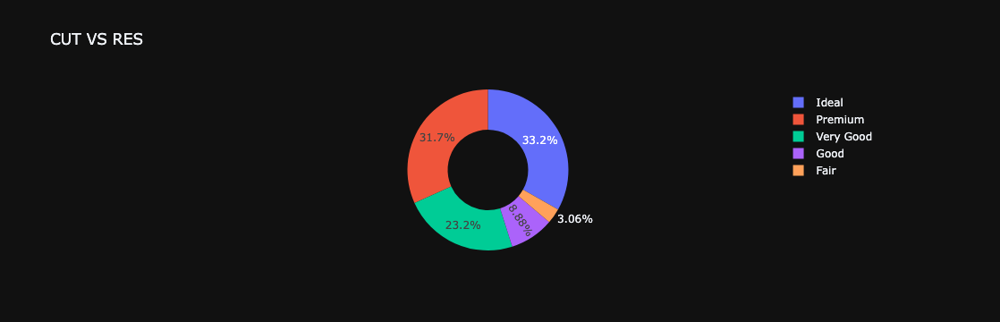

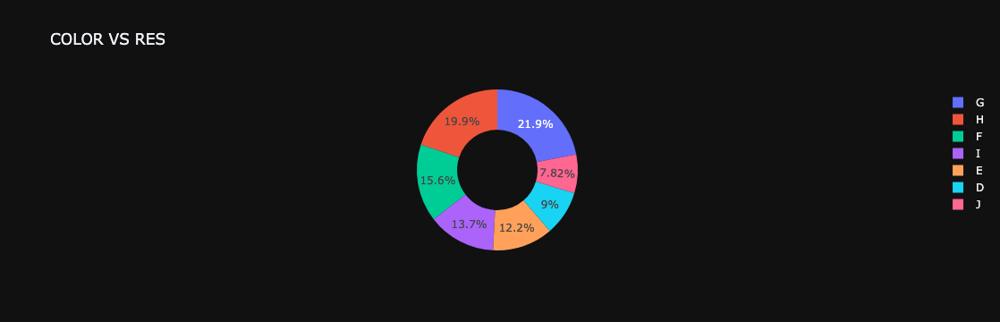

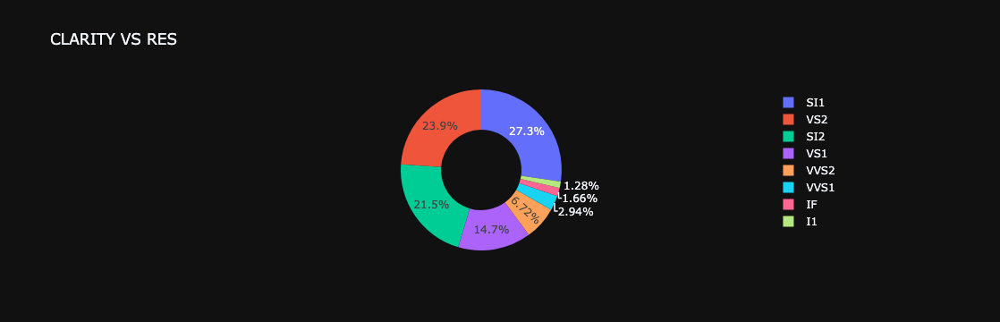

In [110]:
fig = px.pie(names = gp['cut'], values = gp['res'], hole = 0.5, template='plotly_dark', title='CUT VS RES')
fig.show()

fig=px.pie(names=data['color'], values=data['res'], hole=0.5, template='plotly_dark', title='COLOR VS RES' )
fig.show()

fig=px.pie(names = data['clarity'], values=data['res'], hole=0.5, template='plotly_dark', title = 'CLARITY VS RES')
fig.show()


<h3 style = "color : Brown"> Question </h3>

Investigate the variation of price of the diamonds, with respect to the carats. 

In [42]:
groupdata2 = data.groupby('carat')['price'].mean()
groupdata2=groupdata2.reset_index()

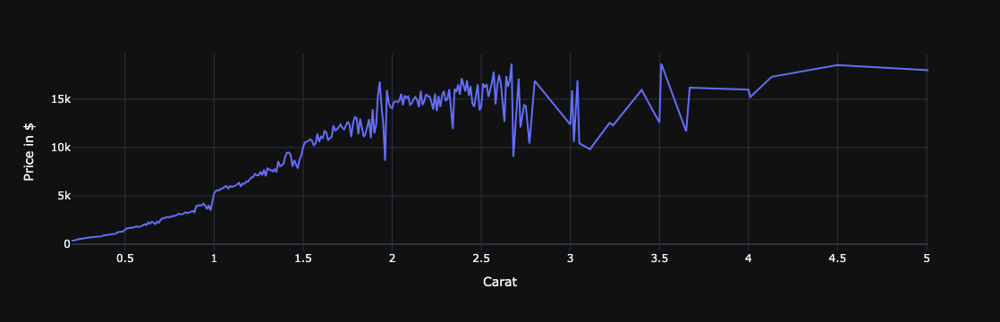

In [44]:
fig = px.line(x= groupdata2['carat'], y=groupdata2['price'], template='plotly_dark')
fig.update_xaxes(title_text='Carat')
fig.update_yaxes(title_text = 'Price in $')


<h3 style = "color : Brown"> Question </h3>

Investigate the relationship of price with respect to the cut of the diamonds. 

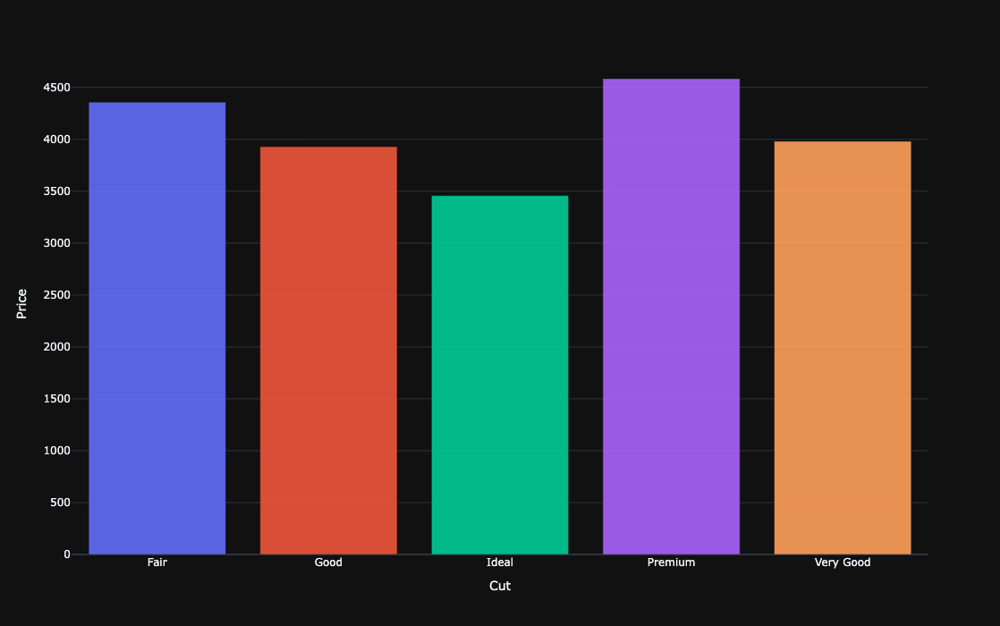

In [78]:
fig = px.bar(x=groupdata1['cut'],y=groupdata1['price'], color=groupdata1['cut'], template='plotly_dark', opacity=0.9)
fig.update_xaxes(tickvals=[0,1,2,3,4], ticktext=['Fair','Good','Ideal','Premium','Very Good'], title_text='Cut')
fig.update_yaxes(title_text='Price')
fig.update_layout(showlegend=False)
fig.update_layout(height=700)
fig.show()

<h3 style = 'color:pink'> Machine Learning </h3>

In [80]:
from sklearn.linear_model import LinearRegression

from sklearn.linear_model import LogisticRegression

In [82]:
lrng_data = data[['carat','depth','x','y','z']]

lrng_data = lrng_data.loc[:40000,:]

price_rl = data.loc[:40000,'price']

model = LinearRegression()

model.fit(lrng_data, price_rl)

LinearRegression()

In [84]:
print(model.coef_)
print(model.intercept_)

[ 9799.97326369  -172.22364175 -1128.20404327   104.43347618
   212.59153906]
11971.661508147663


In [86]:
model.predict(lrng_data)

array([ 109.73809522,  234.07939217,  773.03447112, ..., 1219.94557707,
       1014.75065888,  988.81789737])

In [88]:
def prediction(x):
    return model.predict(x)
    
    

In [90]:
def inp():    
    carat = float(input('enter carat: '))
    x = float(input('enter x: '))
    y = float(input('enter y: '))
    z = float(input('enter z: '))
    depth = z / ((x+y)/2)
    pre = pd.DataFrame([[carat, depth, x, y, z]], columns = ['carat','depth','x','y','z'])
    return prediction(pre).round()
    
    

In [92]:
model2 = LogisticRegression()

In [94]:
inp()

enter carat:  4
enter x:  20
enter y:  20
enter z:  15


array([33756.])

<h3  > Logistic Regression</h3>

In [96]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [98]:
data['res'] = np.where((data['price'] > 4500) | (data['carat'] > 2.9), 1, 0)

In [100]:
res_dat = data.loc[:40000, 'res']
lrng_data2 = data.loc[:40000, ['price','carat','depth','x','y','z']]

In [102]:
model2.fit(lrng_data2, res_dat)

LogisticRegression()

In [104]:
model2.score(lrng_data2, res_dat)

0.9950001249968751

In [106]:
model2.predict([[4000, 7.2, 62.7, 9, 9, 6]])

array([1])